In [0]:
import pyspark
from pyspark.sql import SparkSession

In [0]:
spark = SparkSession.builder.appName('Interswitch Test').getOrCreate()

In [0]:
from pyspark.sql import SparkSession
from pyspark import SparkContext
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType, ArrayType
from pyspark.sql.functions import col

In [0]:
df= spark.read.csv("dbfs:/FileStore/dec17pub.dat") 

In [0]:
df.show()

+--------------------+
|                 _c0|
+--------------------+
|00000479511071912...|
|00000479511071912...|
|00007169100494112...|
|00007169100494112...|
|00007169100494112...|
|00011017798798612...|
|00011017798798612...|
|00011020659338112...|
|00011028481568012...|
|00011032785646912...|
|00011033993545312...|
|00011033993545312...|
|00011033993545312...|
|00011033993545312...|
|00011034386856712...|
|00011034386856712...|
|00011035942433912...|
|00011035942433912...|
|00011041540042912...|
|00011041540042912...|
+--------------------+
only showing top 20 rows



In [0]:
df.count()

Out[161]: 146456

In [0]:
# Let's import some Libraries

from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType, ArrayType
from pyspark.sql.functions import col

In [0]:

# Let me define the indexes so I can split the string
split_index = [0,15,17,21,23,26,28,30,32,34,36,38,40,42,44,46,56,\
                58,60,62,64,66,68,70,75,77,78,80,82,84,86,88,90,91,92,\
                94,95,100,103,104,105,106,107,110,113,117,119,121,123,\
                124,126,128,130,132,134,136,138,140,142,144,146,148,150,\
                152,154,156,158,160,162,165,168,171,173,175,177,179,181,183,\
                185,187,189,191,193,195,197,199,201,203,205,207,209,211,213,\
                215,217,219,221,223,226,228,230,232,234,236,238,240,242,244,246,\
                249,251,256,258,260,262,264,266,268,270,272,274,276,278,280,282,\
                285,287,289,291,293,295,297,299,301,303,305,307,309,311,313,315,\
                317,319,321,323,325,327,329,331,333,335,337,339,341,344,346,348,\
                350,352,354,356,358,360,362,364,366,368,370,372,374,376,378,380,\
                382,384,386,388,390,392,394,396,398,400,402,404,406,409,411,413,\
                415,417,419,421,423,425,427,429,431,433,435,441,443,445,451,453,\
                455,457,459,461,463,465,467,469,471,473,475,477,479,481,483,485,\
                487,489,491,493,495,497,499,501,503,505,507,511,515,519,523,524,\
                526,534,535,539,547,555,556,558,560,562,564,566,568,570,572,574,\
                576,578,580,582,592,602,612,622,632,634,636,638,640,642,644,646,\
                648,650,652,654,656,658,660,662,664,666,668,670,672,674,676,678,\
                680,682,684,686,688,690,692,694,696,698,700,702,704,706,708,710,\
                712,714,716,718,720,722,724,726,728,730,732,734,736,738,740,742,\
                744,746,748,750,752,754,756,758,760,762,764,766,768,770,772,774,\
                776,778,780,782,784,786,788,790,792,794,796,798,800,802,804,806,\
                808,810,812,814,819,821,823,825,827,833,835,837,839,845,855,859,\
                863,867,871,873,875,877,879,881,883,885,887,889,891,893,895,897,\
                899,901,903,905,907,909,911,913,915,917,919,921,923,925,927,929,\
                931,933,935,937,939,941,943,945,947,949,951,953,955,1000]

In [0]:
df = df.withColumnRenamed("_c0", "input_string")


In [0]:

# Define a UDF to split the string at the specified indexes and create a list with three elements
def split_string(input_string):
    parts=[]
    for i in range(len(split_index)-1):
        parts.append( input_string[split_index[i]: split_index[i+1]] )
    return parts




In [0]:
headers = 'HRHHID,HRMONTH,HRYEAR4,HURESPLI,HUFINAL,FILLER,HETENURE,HEHOUSUT,HETELHHD,HETELAVL,HEPHONEO,HEFAMINC,HUTYPEA,HUTYPB,HUTYPC,HWHHWGT,HRINTSTA,HRNUMHOU                ,HRHTYPE,HRMIS,HUINTTYP,HUPRSCNT,HRLONGLK,HRHHID2,HUPRSCNT2,FILLER3,HUBUS,HUBUSL1,HUBUSL2,HUBUSL3,HUBUSL4,GEREG,GEDIV,Filler4,GESTFIPS,Filler5,GTCBSA,GTCO,GTCBSAST,GTMETSTA,GTINDVPC,GTCBSASZ,GTCSA,filler6,filler7,perrp,PEPARENT,PRTAGE,PRTFAGE,PEMARITL,PESPOUSE,PESEX,PEAFEVER,FILLER8,PEAFNOW,PEEDUCA,PTDTRACE,PRDTHSP,PUCHINHH,FILLER9,PULINENO,FILLER10,PRFAMNUM,PRFAMREL,PRFAMTYP,PEHSPNON,PRMARSTA,PRPERTYP,PENATVTY,PEMNTVTY,PEFNTVTY,PRCITSHP,PRCITFLG,PRINUSYR,PUSLFPRX,PEMLR,PUWK,PUBUS1,PUBUS2OT,PUBUSCK1,PUBUSCK2,PUBUSCK3,PUBUSCK4,PURETOT,PUDIS,PERET1,PUDIS1,PUDIS2,PUABSOT,PULAY,PEABSRSN,PEABSPDO,PEMJOT,PEMJNUM,PEHRUSL1,PEHRUSL2,PEHRFTPT,PEHRUSLT,PEHRWANT,PEHRRSN1,PEHRRSN2,PEHRRSN3,PUHROFF1,PUHROFF2,PUHROT1,PUHROT2,PEHRACT1,PEHRACT2,PEHRACTT,PEHRAVL,FILLER11,PUHRCK1,PUHRCK2,PUHRCK3,PUHRCK4,PUHRCK5,PUHRCK6,PUHRCK7,PUHRCK12,PULAYDT,PULAY6M,PELAYAVL,PULAYAVR,PELAYLK,PELAYDUR,PELAYFTO,PULAYCK1,PULAYCK2,PULAYCK3,PULK,PELKM1,PULKM2,PULKM3,PULKM4,PULKM5,PULKM6,PULKDK1,PULKDK2,PULKDK3,PULKDK4,PULKDK5,PULKDK6,PULKPS1,PULKPS2,PULKPS3,PULKPS4,PULKPS5,PULKPS6,PELKAVL,PULKAVR,PELKLL1O,PELKLL2O,PELKLWO,PELKDUR,PELKFTO,PEDWWNTO,PEDWRSN,PEDWLKO,PEDWWK,PEDW4WK,PEDWLKWK,PEDWAVL,PEDWAVR,PUDWCK1,PUDWCK2,PUDWCK3,PUDWCK4,PUDWCK5,PEJHWKO,PUJHDP1O,PEJHRSN,PEJHWANT,PUJHCK1,PUJHCK2,PRABSREA,PRCIVLF,PRDISC,PREMPHRS,PREMPNOT,PREXPLF,PRFTLF,PRHRUSL,PRJOBSEA,PRPTHRS,PRPTREA,PRUNEDUR,FILLER12,PRUNTYPE,PRWKSCH,PRWKSTAT,PRWNTJOB,PUJHCK3,PUJHCK4,PUJHCK5,PUIODP1,PUIODP2,PUIODP3,PEIO1COW,PUIO1MFG,PADDING,PEIO2COW,PUIO2MFG,PADDING13,PUIOCK1,PUIOCK2,PUIOCK3,PRIOELG,PRAGNA,PRCOW1,PRCOW2,PRCOWPG,PRDTCOW1,PRDTCOW2,PRDTIND1,PRDTIND2,PRDTOCC1,PRDTOCC2,PREMP,PRMJIND1,PRMJIND2,PRMJOCC1,PRMJOCC2,PRMJOCGR,PRNAGPWS,PRNAGWS,PRSJMJ,PRERELG,PEERNUOT,PEERNPER,PEERNRT,PEERNHRY,PUERNH1C,PEERNH2,PEERNH1O,PRERNHLY,PTHR,PEERNHRO,PRERNWA,PTWK,FILLER14,PEERN,PUERN2,PTOT,FILLER15,PEERNWKP,PEERNLAB,PEERNCOV,PENLFJH,PENLFRET,PENLFACT,PUNLFCK1,PUNLFCK2,PESCHENR,PESCHFT,PESCHLVL,PRNLFSCH,PWFMWGT,PWLGWGT,PWORWGT,PWSSWGT,PWVETWGT,PRCHLD,PRNMCHLD,PXPDEMP1,PRWERNAL,PRHERNAL,HXTENURE,HXHOUSUT,HXTELHHD,HXTELAVL,HXPHONEO,PXINUSYR,PXRRP,PXPARENT,PXAGE,PXMARITL,PXSPOUSE,PXSEX,PXAFWHN1,PXAFNOW,PXEDUCA,PXRACE1,PXNATVTY,PXMNTVTY,PXFNTVTY,PXNMEMP1,PXHSPNON,PXMLR,PXRET1,PXABSRSN,PXABSPDO,PXMJOT,PXMJNUM,PXHRUSL1,PXHRUSL2,PXHRFTPT,PXHRUSLT,PXHRWANT,PXHRRSN1,PXHRRSN2,PXHRACT1,PXHRACT2,PXHRACTT,PXHRRSN3,PXHRAVL,PXLAYAVL,PXLAYLK,PXLAYDUR,PXLAYFTO,PXLKM1,PXLKAVL,PXLKLL1O,PXLKLL2O,PXLKLWO,PXLKDUR,PXLKFTO,PXDWWNTO,PXDWRSN,PXDWLKO,PXDWWK,PXDW4WK,PXDWLKWK,PXDWAVL,PXDWAVR,PXJHWKO,PXJHRSN,PXJHWANT,PXIO1COW,PXIO1ICD,PXIO1OCD,PXIO2COW,PXIO2ICD,PXIO2OCD,PXERNUOT,PXERNPER,PXERNH1O,PXERNHRO,PXERN,PXPDEMP2,PXNMEMP2,PXERNWKP,PXERNRT,PXERNHRY,PXERNH2,PXERNLAB,PXERNCOV,PXNLFJH,PXNLFRET,PXNLFACT,PXSCHENR,PXSCHFT,PXSCHLVL,QSTNUM,OCCURNUM,PEDIPGED,PEHGCOMP,PECYC,PADDING16,PXDIPGED,PXHGCOMP,PXCYC,PADDING17,PWCMPWGT,PEIO1ICD,PEIO1OCD,PEIO2ICD,PEIO2OCD,PRIMIND1,PRIMIND2,PEAFWHN1,PEAFWHN2,PEAFWHN3,PEAFWHN4,PXAFEVER,PELNDAD,PELNMOM,PEDADTYP,PEMOMTYP,PECOHAB,PXLNDAD,PXLNMOM,PXDADTYP,PXMOMTYP,PXCOHAB,PEDISEAR,PEDISEYE,PEDISREM,PEDISPHY,PEDISDRS,PEDISOUT,PRDISFLG,PXDISEAR,PXDISEYE,PXDISREM,PXDISPHY,PXDISDRS,PXDISOUT,HXFAMINC,PRDASIAN,PEPDEMP1,PTNMEMP1,PEPDEMP2,PTNMEMP2,PECERT1,PECERT2,PECERT3,PXCERT1,PXCERT2,PXCERT3,Filler18'
headers = headers.split(',')
headers

Out[166]: ['HRHHID',
 'HRMONTH',
 'HRYEAR4',
 'HURESPLI',
 'HUFINAL',
 'FILLER',
 'HETENURE',
 'HEHOUSUT',
 'HETELHHD',
 'HETELAVL',
 'HEPHONEO',
 'HEFAMINC',
 'HUTYPEA',
 'HUTYPB',
 'HUTYPC',
 'HWHHWGT',
 'HRINTSTA',
 'HRNUMHOU                ',
 'HRHTYPE',
 'HRMIS',
 'HUINTTYP',
 'HUPRSCNT',
 'HRLONGLK',
 'HRHHID2',
 'HUPRSCNT2',
 'FILLER3',
 'HUBUS',
 'HUBUSL1',
 'HUBUSL2',
 'HUBUSL3',
 'HUBUSL4',
 'GEREG',
 'GEDIV',
 'Filler4',
 'GESTFIPS',
 'Filler5',
 'GTCBSA',
 'GTCO',
 'GTCBSAST',
 'GTMETSTA',
 'GTINDVPC',
 'GTCBSASZ',
 'GTCSA',
 'filler6',
 'filler7',
 'perrp',
 'PEPARENT',
 'PRTAGE',
 'PRTFAGE',
 'PEMARITL',
 'PESPOUSE',
 'PESEX',
 'PEAFEVER',
 'FILLER8',
 'PEAFNOW',
 'PEEDUCA',
 'PTDTRACE',
 'PRDTHSP',
 'PUCHINHH',
 'FILLER9',
 'PULINENO',
 'FILLER10',
 'PRFAMNUM',
 'PRFAMREL',
 'PRFAMTYP',
 'PEHSPNON',
 'PRMARSTA',
 'PRPERTYP',
 'PENATVTY',
 'PEMNTVTY',
 'PEFNTVTY',
 'PRCITSHP',
 'PRCITFLG',
 'PRINUSYR',
 'PUSLFPRX',
 'PEMLR',
 'PUWK',
 'PUBUS1',
 'PUBUS2OT',
 'PUBUSCK1',
 

In [0]:
df.show()

+--------------------+
|        input_string|
+--------------------+
|00000479511071912...|
|00000479511071912...|
|00007169100494112...|
|00007169100494112...|
|00007169100494112...|
|00011017798798612...|
|00011017798798612...|
|00011020659338112...|
|00011028481568012...|
|00011032785646912...|
|00011033993545312...|
|00011033993545312...|
|00011033993545312...|
|00011033993545312...|
|00011034386856712...|
|00011034386856712...|
|00011035942433912...|
|00011035942433912...|
|00011041540042912...|
|00011041540042912...|
+--------------------+
only showing top 20 rows



In [0]:
df = df.withColumnRenamed("_c0", "input_string")

In [0]:
split_udf = udf(split_string, ArrayType(StringType()))

# Apply the UDF to create a new list column
df_with_list = df.withColumn("split_result", split_udf(df["input_string"]))

# Show the resulting DataFrame
df_with_list.show(truncate=False)



+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [0]:
df_with_list.show(5)

+--------------------+--------------------+
|        input_string|        split_result|
+--------------------+--------------------+
|00000479511071912...|[000004795110719,...|
|00000479511071912...|[000004795110719,...|
|00007169100494112...|[000071691004941,...|
|00007169100494112...|[000071691004941,...|
|00007169100494112...|[000071691004941,...|
+--------------------+--------------------+
only showing top 5 rows



In [0]:
num_elements = len(split_index)-1

In [0]:
num_elements

Out[172]: 410

In [0]:
len(headers)

Out[173]: 410

In [0]:
for i in range(num_elements):
    df_with_list = df_with_list.withColumn(headers[i], col("split_result")[i])


In [0]:
df_with_list.show(truncate= False)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [0]:
display(df_with_list)

input_string,split_result,HRHHID,HRMONTH,HRYEAR4,HURESPLI,HUFINAL,FILLER,HETENURE,HEHOUSUT,HETELHHD,HETELAVL,HEPHONEO,HEFAMINC,HUTYPEA,HUTYPB,HUTYPC,HWHHWGT,HRINTSTA,HRNUMHOU,HRHTYPE,HRMIS,HUINTTYP,HUPRSCNT,HRLONGLK,HRHHID2,HUPRSCNT2,FILLER3,HUBUS,HUBUSL1,HUBUSL2,HUBUSL3,HUBUSL4,GEREG,GEDIV,Filler4,GESTFIPS,Filler5,GTCBSA,GTCO,GTCBSAST,GTMETSTA,GTINDVPC,GTCBSASZ,GTCSA,filler6,filler7,perrp,PEPARENT,PRTAGE,PRTFAGE,PEMARITL,PESPOUSE,PESEX,PEAFEVER,FILLER8,PEAFNOW,PEEDUCA,PTDTRACE,PRDTHSP,PUCHINHH,FILLER9,PULINENO,FILLER10,PRFAMNUM,PRFAMREL,PRFAMTYP,PEHSPNON,PRMARSTA,PRPERTYP,PENATVTY,PEMNTVTY,PEFNTVTY,PRCITSHP,PRCITFLG,PRINUSYR,PUSLFPRX,PEMLR,PUWK,PUBUS1,PUBUS2OT,PUBUSCK1,PUBUSCK2,PUBUSCK3,PUBUSCK4,PURETOT,PUDIS,PERET1,PUDIS1,PUDIS2,PUABSOT,PULAY,PEABSRSN,PEABSPDO,PEMJOT,PEMJNUM,PEHRUSL1,PEHRUSL2,PEHRFTPT,PEHRUSLT,PEHRWANT,PEHRRSN1,PEHRRSN2,PEHRRSN3,PUHROFF1,PUHROFF2,PUHROT1,PUHROT2,PEHRACT1,PEHRACT2,PEHRACTT,PEHRAVL,FILLER11,PUHRCK1,PUHRCK2,PUHRCK3,PUHRCK4,PUHRCK5,PUHRCK6,PUHRCK7,PUHRCK12,PULAYDT,PULAY6M,PELAYAVL,PULAYAVR,PELAYLK,PELAYDUR,PELAYFTO,PULAYCK1,PULAYCK2,PULAYCK3,PULK,PELKM1,PULKM2,PULKM3,PULKM4,PULKM5,PULKM6,PULKDK1,PULKDK2,PULKDK3,PULKDK4,PULKDK5,PULKDK6,PULKPS1,PULKPS2,PULKPS3,PULKPS4,PULKPS5,PULKPS6,PELKAVL,PULKAVR,PELKLL1O,PELKLL2O,PELKLWO,PELKDUR,PELKFTO,PEDWWNTO,PEDWRSN,PEDWLKO,PEDWWK,PEDW4WK,PEDWLKWK,PEDWAVL,PEDWAVR,PUDWCK1,PUDWCK2,PUDWCK3,PUDWCK4,PUDWCK5,PEJHWKO,PUJHDP1O,PEJHRSN,PEJHWANT,PUJHCK1,PUJHCK2,PRABSREA,PRCIVLF,PRDISC,PREMPHRS,PREMPNOT,PREXPLF,PRFTLF,PRHRUSL,PRJOBSEA,PRPTHRS,PRPTREA,PRUNEDUR,FILLER12,PRUNTYPE,PRWKSCH,PRWKSTAT,PRWNTJOB,PUJHCK3,PUJHCK4,PUJHCK5,PUIODP1,PUIODP2,PUIODP3,PEIO1COW,PUIO1MFG,PADDING,PEIO2COW,PUIO2MFG,PADDING13,PUIOCK1,PUIOCK2,PUIOCK3,PRIOELG,PRAGNA,PRCOW1,PRCOW2,PRCOWPG,PRDTCOW1,PRDTCOW2,PRDTIND1,PRDTIND2,PRDTOCC1,PRDTOCC2,PREMP,PRMJIND1,PRMJIND2,PRMJOCC1,PRMJOCC2,PRMJOCGR,PRNAGPWS,PRNAGWS,PRSJMJ,PRERELG,PEERNUOT,PEERNPER,PEERNRT,PEERNHRY,PUERNH1C,PEERNH2,PEERNH1O,PRERNHLY,PTHR,PEERNHRO,PRERNWA,PTWK,FILLER14,PEERN,PUERN2,PTOT,FILLER15,PEERNWKP,PEERNLAB,PEERNCOV,PENLFJH,PENLFRET,PENLFACT,PUNLFCK1,PUNLFCK2,PESCHENR,PESCHFT,PESCHLVL,PRNLFSCH,PWFMWGT,PWLGWGT,PWORWGT,PWSSWGT,PWVETWGT,PRCHLD,PRNMCHLD,PXPDEMP1,PRWERNAL,PRHERNAL,HXTENURE,HXHOUSUT,HXTELHHD,HXTELAVL,HXPHONEO,PXINUSYR,PXRRP,PXPARENT,PXAGE,PXMARITL,PXSPOUSE,PXSEX,PXAFWHN1,PXAFNOW,PXEDUCA,PXRACE1,PXNATVTY,PXMNTVTY,PXFNTVTY,PXNMEMP1,PXHSPNON,PXMLR,PXRET1,PXABSRSN,PXABSPDO,PXMJOT,PXMJNUM,PXHRUSL1,PXHRUSL2,PXHRFTPT,PXHRUSLT,PXHRWANT,PXHRRSN1,PXHRRSN2,PXHRACT1,PXHRACT2,PXHRACTT,PXHRRSN3,PXHRAVL,PXLAYAVL,PXLAYLK,PXLAYDUR,PXLAYFTO,PXLKM1,PXLKAVL,PXLKLL1O,PXLKLL2O,PXLKLWO,PXLKDUR,PXLKFTO,PXDWWNTO,PXDWRSN,PXDWLKO,PXDWWK,PXDW4WK,PXDWLKWK,PXDWAVL,PXDWAVR,PXJHWKO,PXJHRSN,PXJHWANT,PXIO1COW,PXIO1ICD,PXIO1OCD,PXIO2COW,PXIO2ICD,PXIO2OCD,PXERNUOT,PXERNPER,PXERNH1O,PXERNHRO,PXERN,PXPDEMP2,PXNMEMP2,PXERNWKP,PXERNRT,PXERNHRY,PXERNH2,PXERNLAB,PXERNCOV,PXNLFJH,PXNLFRET,PXNLFACT,PXSCHENR,PXSCHFT,PXSCHLVL,QSTNUM,OCCURNUM,PEDIPGED,PEHGCOMP,PECYC,PADDING16,PXDIPGED,PXHGCOMP,PXCYC,PADDING17,PWCMPWGT,PEIO1ICD,PEIO1OCD,PEIO2ICD,PEIO2OCD,PRIMIND1,PRIMIND2,PEAFWHN1,PEAFWHN2,PEAFWHN3,PEAFWHN4,PXAFEVER,PELNDAD,PELNMOM,PEDADTYP,PEMOMTYP,PECOHAB,PXLNDAD,PXLNMOM,PXDADTYP,PXMOMTYP,PXCOHAB,PEDISEAR,PEDISEYE,PEDISREM,PEDISPHY,PEDISDRS,PEDISOUT,PRDISFLG,PXDISEAR,PXDISEYE,PXDISREM,PXDISPHY,PXDISDRS,PXDISOUT,HXFAMINC,PRDASIAN,PEPDEMP1,PTNMEMP1,PEPDEMP2,PTNMEMP2,PECERT1,PECERT2,PECERT3,PXCERT1,PXCERT2,PXCERT3,Filler18
000004795110719122017 120100-1 1 1-1 1 9-1-1-1 14394041 1 2 1 7 2 0 206011 2 2-1-1-1-1 36 01 266200001103000 -1-1 1-1710 1 2 1 1-1 242 1-1 9-1 1-1 1 1 1 2 1 2 57 57 57 1 0 0 1 6 2-1-1 2-1-1-1-1 1-1-1-1-1-1-1-1-1-1-1-1-1 -1-1-1-1-1-1-1-1-1-1-1 -1-1-1 -1-1-1-1-1-1-1-1-1-1-1-1-1 -1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1 -1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1 2-1 0 4-1-1-1-1-1-1 -1-1-1 0 1 2-1-1-1-1-1-1-1-1 -1-1 -1-1-1 0-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1-1 0-1-1-1-1 -1 -1 -1 -10-1 -10-1-1 -1 -10-1-1-1-1-1-1-1-1 2-1-1-1-1 143940

In [0]:
# Let's make our DataFrame clean by dropping the messy columns where we have extracted all our clean data from.

df_with_list = df_with_list.drop('input_string')
df_with_list = df_with_list.drop('split_result')

##### Alright! this is great! we now have a clean DataFrame

In [0]:
display(df_with_list)

HRHHID,HRMONTH,HRYEAR4,HURESPLI,HUFINAL,FILLER,HETENURE,HEHOUSUT,HETELHHD,HETELAVL,HEPHONEO,HEFAMINC,HUTYPEA,HUTYPB,HUTYPC,HWHHWGT,HRINTSTA,HRNUMHOU,HRHTYPE,HRMIS,HUINTTYP,HUPRSCNT,HRLONGLK,HRHHID2,HUPRSCNT2,FILLER3,HUBUS,HUBUSL1,HUBUSL2,HUBUSL3,HUBUSL4,GEREG,GEDIV,Filler4,GESTFIPS,Filler5,GTCBSA,GTCO,GTCBSAST,GTMETSTA,GTINDVPC,GTCBSASZ,GTCSA,filler6,filler7,perrp,PEPARENT,PRTAGE,PRTFAGE,PEMARITL,PESPOUSE,PESEX,PEAFEVER,FILLER8,PEAFNOW,PEEDUCA,PTDTRACE,PRDTHSP,PUCHINHH,FILLER9,PULINENO,FILLER10,PRFAMNUM,PRFAMREL,PRFAMTYP,PEHSPNON,PRMARSTA,PRPERTYP,PENATVTY,PEMNTVTY,PEFNTVTY,PRCITSHP,PRCITFLG,PRINUSYR,PUSLFPRX,PEMLR,PUWK,PUBUS1,PUBUS2OT,PUBUSCK1,PUBUSCK2,PUBUSCK3,PUBUSCK4,PURETOT,PUDIS,PERET1,PUDIS1,PUDIS2,PUABSOT,PULAY,PEABSRSN,PEABSPDO,PEMJOT,PEMJNUM,PEHRUSL1,PEHRUSL2,PEHRFTPT,PEHRUSLT,PEHRWANT,PEHRRSN1,PEHRRSN2,PEHRRSN3,PUHROFF1,PUHROFF2,PUHROT1,PUHROT2,PEHRACT1,PEHRACT2,PEHRACTT,PEHRAVL,FILLER11,PUHRCK1,PUHRCK2,PUHRCK3,PUHRCK4,PUHRCK5,PUHRCK6,PUHRCK7,PUHRCK12,PULAYDT,PULAY6M,PELAYAVL,PULAYAVR,PELAYLK,PELAYDUR,PELAYFTO,PULAYCK1,PULAYCK2,PULAYCK3,PULK,PELKM1,PULKM2,PULKM3,PULKM4,PULKM5,PULKM6,PULKDK1,PULKDK2,PULKDK3,PULKDK4,PULKDK5,PULKDK6,PULKPS1,PULKPS2,PULKPS3,PULKPS4,PULKPS5,PULKPS6,PELKAVL,PULKAVR,PELKLL1O,PELKLL2O,PELKLWO,PELKDUR,PELKFTO,PEDWWNTO,PEDWRSN,PEDWLKO,PEDWWK,PEDW4WK,PEDWLKWK,PEDWAVL,PEDWAVR,PUDWCK1,PUDWCK2,PUDWCK3,PUDWCK4,PUDWCK5,PEJHWKO,PUJHDP1O,PEJHRSN,PEJHWANT,PUJHCK1,PUJHCK2,PRABSREA,PRCIVLF,PRDISC,PREMPHRS,PREMPNOT,PREXPLF,PRFTLF,PRHRUSL,PRJOBSEA,PRPTHRS,PRPTREA,PRUNEDUR,FILLER12,PRUNTYPE,PRWKSCH,PRWKSTAT,PRWNTJOB,PUJHCK3,PUJHCK4,PUJHCK5,PUIODP1,PUIODP2,PUIODP3,PEIO1COW,PUIO1MFG,PADDING,PEIO2COW,PUIO2MFG,PADDING13,PUIOCK1,PUIOCK2,PUIOCK3,PRIOELG,PRAGNA,PRCOW1,PRCOW2,PRCOWPG,PRDTCOW1,PRDTCOW2,PRDTIND1,PRDTIND2,PRDTOCC1,PRDTOCC2,PREMP,PRMJIND1,PRMJIND2,PRMJOCC1,PRMJOCC2,PRMJOCGR,PRNAGPWS,PRNAGWS,PRSJMJ,PRERELG,PEERNUOT,PEERNPER,PEERNRT,PEERNHRY,PUERNH1C,PEERNH2,PEERNH1O,PRERNHLY,PTHR,PEERNHRO,PRERNWA,PTWK,FILLER14,PEERN,PUERN2,PTOT,FILLER15,PEERNWKP,PEERNLAB,PEERNCOV,PENLFJH,PENLFRET,PENLFACT,PUNLFCK1,PUNLFCK2,PESCHENR,PESCHFT,PESCHLVL,PRNLFSCH,PWFMWGT,PWLGWGT,PWORWGT,PWSSWGT,PWVETWGT,PRCHLD,PRNMCHLD,PXPDEMP1,PRWERNAL,PRHERNAL,HXTENURE,HXHOUSUT,HXTELHHD,HXTELAVL,HXPHONEO,PXINUSYR,PXRRP,PXPARENT,PXAGE,PXMARITL,PXSPOUSE,PXSEX,PXAFWHN1,PXAFNOW,PXEDUCA,PXRACE1,PXNATVTY,PXMNTVTY,PXFNTVTY,PXNMEMP1,PXHSPNON,PXMLR,PXRET1,PXABSRSN,PXABSPDO,PXMJOT,PXMJNUM,PXHRUSL1,PXHRUSL2,PXHRFTPT,PXHRUSLT,PXHRWANT,PXHRRSN1,PXHRRSN2,PXHRACT1,PXHRACT2,PXHRACTT,PXHRRSN3,PXHRAVL,PXLAYAVL,PXLAYLK,PXLAYDUR,PXLAYFTO,PXLKM1,PXLKAVL,PXLKLL1O,PXLKLL2O,PXLKLWO,PXLKDUR,PXLKFTO,PXDWWNTO,PXDWRSN,PXDWLKO,PXDWWK,PXDW4WK,PXDWLKWK,PXDWAVL,PXDWAVR,PXJHWKO,PXJHRSN,PXJHWANT,PXIO1COW,PXIO1ICD,PXIO1OCD,PXIO2COW,PXIO2ICD,PXIO2OCD,PXERNUOT,PXERNPER,PXERNH1O,PXERNHRO,PXERN,PXPDEMP2,PXNMEMP2,PXERNWKP,PXERNRT,PXERNHRY,PXERNH2,PXERNLAB,PXERNCOV,PXNLFJH,PXNLFRET,PXNLFACT,PXSCHENR,PXSCHFT,PXSCHLVL,QSTNUM,OCCURNUM,PEDIPGED,PEHGCOMP,PECYC,PADDING16,PXDIPGED,PXHGCOMP,PXCYC,PADDING17,PWCMPWGT,PEIO1ICD,PEIO1OCD,PEIO2ICD,PEIO2OCD,PRIMIND1,PRIMIND2,PEAFWHN1,PEAFWHN2,PEAFWHN3,PEAFWHN4,PXAFEVER,PELNDAD,PELNMOM,PEDADTYP,PEMOMTYP,PECOHAB,PXLNDAD,PXLNMOM,PXDADTYP,PXMOMTYP,PXCOHAB,PEDISEAR,PEDISEYE,PEDISREM,PEDISPHY,PEDISDRS,PEDISOUT,PRDISFLG,PXDISEAR,PXDISEYE,PXDISREM,PXDISPHY,PXDISDRS,PXDISOUT,HXFAMINC,PRDASIAN,PEPDEMP1,PTNMEMP1,PEPDEMP2,PTNMEMP2,PECERT1,PECERT2,PECERT3,PXCERT1,PXCERT2,PXCERT3,Filler18
000004795110719,12,2017,1,201,00,-1,1,1,-1,1,9,-1,-1,-1,14394041,1,2,1,7,2,0,2,06011,2,,2,-1,-1,-1,-1,3,6,,01,,26620,000,1,1,0,3,000,,-1-1,1,-1,71,0,1,2,1,1,-1,2,42,1,-1,9,-1,1,-1,1,1,1,2,1,2,57,57,57,1,0,0,1,6,2,-1,-1,2,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,-1,0,4,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1,2,-1,-1,-1,-1,-1,-1,-1,-1,,-1,-1,,-

In [0]:
# Let's ensure our records are map to a header

df_with_header = df_with_list.toDF(*headers)

###Questions and Answers

####1). Now let's show a sample of ten records for Household Identifier. Recall that we have two Household Identifier part 1 and 2 (HRHHID, HRHHID2) respectively

In [0]:
# Show the 10 records of a Full household identifier.

# Recall that we have two Household Identifier part 1 and 2 (HRHHID, HRHHID2) respectively

df_with_header.select("HRHHID", "HRHHID2").show(10)

+---------------+-------+
|         HRHHID|HRHHID2|
+---------------+-------+
|000004795110719|  06011|
|000004795110719|  06011|
|000071691004941|  06111|
|000071691004941|  06111|
|000071691004941|  06111|
|000110177987986|  08011|
|000110177987986|  08011|
|000110206593381|  08011|
|000110284815680|  08111|
|000110327856469|  06111|
+---------------+-------+
only showing top 10 rows



####2). To find the year of interview in year/month format we can concatenate the two columns year (HRYEAR4) and month (HRMONTH) respectively using a "/" charater in between. Let's also show this in a sample of ten records

In [0]:
# Let's import a function for concatenation
from pyspark.sql.functions import concat_ws

In [0]:
df_year = df_with_header.select("HRYEAR4")
df_month = df_with_header.select("HRMONTH")

In [0]:
# Join two columns with a "/" character in between
df_year_month = df_with_header.withColumn("year/month", concat_ws("/", df_year["HRYEAR4"], df_month["HRMONTH"]))

df_year_month.select("year/month").show(10)

+----------+
|year/month|
+----------+
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
|   2017/12|
+----------+
only showing top 10 rows



####3). Let's find the 10 records of the Final Outcome Code/Survey (HUFINAL)

In [0]:
# Show the 10 records of the Final Outcome Code/Survey.

df_with_header.select("HUFINAL").show(10)

+-------+
|HUFINAL|
+-------+
|    201|
|    201|
|    201|
|    201|
|    201|
|    201|
|    201|
|    213|
|    201|
|    201|
+-------+
only showing top 10 rows



####4). Let's find the 10 records of the Type of Housing Unit (HEHOUSUT).

In [0]:
# Show the 10 records of the Type of housing unit.

df_with_header.select("HEHOUSUT").show(10)

+--------+
|HEHOUSUT|
+--------+
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
+--------+
only showing top 10 rows



####5). Let's find the 10 records of the Household Type (HRHTYPE).

In [0]:
# Show the 10 records of the Household Type.

df_with_header.select("HRHTYPE").show(10)

+-------+
|HRHTYPE|
+-------+
|      1|
|      1|
|      1|
|      1|
|      1|
|      1|
|      1|
|      0|
|      7|
|      7|
+-------+
only showing top 10 rows



####6). Let's find the 10 records of Apartment/Household (HETELHHD) has a telephone.

In [0]:
household_with_tele = (df_with_header["HETELHHD"] == 1)

# Let's apply a filter
filtered = df_with_header.filter(household_with_tele)
filtered.select(household_with_tele).show(10)

+--------------+
|(HETELHHD = 1)|
+--------------+
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
+--------------+
only showing top 10 rows



####Now let's further view 10 records of the DataFrame where Apartment/Household (HETELHHD) has a telephone.

In [0]:
# Let's Filter the DataFrame to get rows where the "HETELHHD" column equals the desired value
filtered_df = df_with_header.filter(df_with_header["HETELHHD"] == 1)

# Limit the result to 10 rows
result = filtered_df.limit(10)
display(result)

HRHHID,HRMONTH,HRYEAR4,HURESPLI,HUFINAL,FILLER,HETENURE,HEHOUSUT,HETELHHD,HETELAVL,HEPHONEO,HEFAMINC,HUTYPEA,HUTYPB,HUTYPC,HWHHWGT,HRINTSTA,HRNUMHOU,HRHTYPE,HRMIS,HUINTTYP,HUPRSCNT,HRLONGLK,HRHHID2,HUPRSCNT2,FILLER3,HUBUS,HUBUSL1,HUBUSL2,HUBUSL3,HUBUSL4,GEREG,GEDIV,Filler4,GESTFIPS,Filler5,GTCBSA,GTCO,GTCBSAST,GTMETSTA,GTINDVPC,GTCBSASZ,GTCSA,filler6,filler7,perrp,PEPARENT,PRTAGE,PRTFAGE,PEMARITL,PESPOUSE,PESEX,PEAFEVER,FILLER8,PEAFNOW,PEEDUCA,PTDTRACE,PRDTHSP,PUCHINHH,FILLER9,PULINENO,FILLER10,PRFAMNUM,PRFAMREL,PRFAMTYP,PEHSPNON,PRMARSTA,PRPERTYP,PENATVTY,PEMNTVTY,PEFNTVTY,PRCITSHP,PRCITFLG,PRINUSYR,PUSLFPRX,PEMLR,PUWK,PUBUS1,PUBUS2OT,PUBUSCK1,PUBUSCK2,PUBUSCK3,PUBUSCK4,PURETOT,PUDIS,PERET1,PUDIS1,PUDIS2,PUABSOT,PULAY,PEABSRSN,PEABSPDO,PEMJOT,PEMJNUM,PEHRUSL1,PEHRUSL2,PEHRFTPT,PEHRUSLT,PEHRWANT,PEHRRSN1,PEHRRSN2,PEHRRSN3,PUHROFF1,PUHROFF2,PUHROT1,PUHROT2,PEHRACT1,PEHRACT2,PEHRACTT,PEHRAVL,FILLER11,PUHRCK1,PUHRCK2,PUHRCK3,PUHRCK4,PUHRCK5,PUHRCK6,PUHRCK7,PUHRCK12,PULAYDT,PULAY6M,PELAYAVL,PULAYAVR,PELAYLK,PELAYDUR,PELAYFTO,PULAYCK1,PULAYCK2,PULAYCK3,PULK,PELKM1,PULKM2,PULKM3,PULKM4,PULKM5,PULKM6,PULKDK1,PULKDK2,PULKDK3,PULKDK4,PULKDK5,PULKDK6,PULKPS1,PULKPS2,PULKPS3,PULKPS4,PULKPS5,PULKPS6,PELKAVL,PULKAVR,PELKLL1O,PELKLL2O,PELKLWO,PELKDUR,PELKFTO,PEDWWNTO,PEDWRSN,PEDWLKO,PEDWWK,PEDW4WK,PEDWLKWK,PEDWAVL,PEDWAVR,PUDWCK1,PUDWCK2,PUDWCK3,PUDWCK4,PUDWCK5,PEJHWKO,PUJHDP1O,PEJHRSN,PEJHWANT,PUJHCK1,PUJHCK2,PRABSREA,PRCIVLF,PRDISC,PREMPHRS,PREMPNOT,PREXPLF,PRFTLF,PRHRUSL,PRJOBSEA,PRPTHRS,PRPTREA,PRUNEDUR,FILLER12,PRUNTYPE,PRWKSCH,PRWKSTAT,PRWNTJOB,PUJHCK3,PUJHCK4,PUJHCK5,PUIODP1,PUIODP2,PUIODP3,PEIO1COW,PUIO1MFG,PADDING,PEIO2COW,PUIO2MFG,PADDING13,PUIOCK1,PUIOCK2,PUIOCK3,PRIOELG,PRAGNA,PRCOW1,PRCOW2,PRCOWPG,PRDTCOW1,PRDTCOW2,PRDTIND1,PRDTIND2,PRDTOCC1,PRDTOCC2,PREMP,PRMJIND1,PRMJIND2,PRMJOCC1,PRMJOCC2,PRMJOCGR,PRNAGPWS,PRNAGWS,PRSJMJ,PRERELG,PEERNUOT,PEERNPER,PEERNRT,PEERNHRY,PUERNH1C,PEERNH2,PEERNH1O,PRERNHLY,PTHR,PEERNHRO,PRERNWA,PTWK,FILLER14,PEERN,PUERN2,PTOT,FILLER15,PEERNWKP,PEERNLAB,PEERNCOV,PENLFJH,PENLFRET,PENLFACT,PUNLFCK1,PUNLFCK2,PESCHENR,PESCHFT,PESCHLVL,PRNLFSCH,PWFMWGT,PWLGWGT,PWORWGT,PWSSWGT,PWVETWGT,PRCHLD,PRNMCHLD,PXPDEMP1,PRWERNAL,PRHERNAL,HXTENURE,HXHOUSUT,HXTELHHD,HXTELAVL,HXPHONEO,PXINUSYR,PXRRP,PXPARENT,PXAGE,PXMARITL,PXSPOUSE,PXSEX,PXAFWHN1,PXAFNOW,PXEDUCA,PXRACE1,PXNATVTY,PXMNTVTY,PXFNTVTY,PXNMEMP1,PXHSPNON,PXMLR,PXRET1,PXABSRSN,PXABSPDO,PXMJOT,PXMJNUM,PXHRUSL1,PXHRUSL2,PXHRFTPT,PXHRUSLT,PXHRWANT,PXHRRSN1,PXHRRSN2,PXHRACT1,PXHRACT2,PXHRACTT,PXHRRSN3,PXHRAVL,PXLAYAVL,PXLAYLK,PXLAYDUR,PXLAYFTO,PXLKM1,PXLKAVL,PXLKLL1O,PXLKLL2O,PXLKLWO,PXLKDUR,PXLKFTO,PXDWWNTO,PXDWRSN,PXDWLKO,PXDWWK,PXDW4WK,PXDWLKWK,PXDWAVL,PXDWAVR,PXJHWKO,PXJHRSN,PXJHWANT,PXIO1COW,PXIO1ICD,PXIO1OCD,PXIO2COW,PXIO2ICD,PXIO2OCD,PXERNUOT,PXERNPER,PXERNH1O,PXERNHRO,PXERN,PXPDEMP2,PXNMEMP2,PXERNWKP,PXERNRT,PXERNHRY,PXERNH2,PXERNLAB,PXERNCOV,PXNLFJH,PXNLFRET,PXNLFACT,PXSCHENR,PXSCHFT,PXSCHLVL,QSTNUM,OCCURNUM,PEDIPGED,PEHGCOMP,PECYC,PADDING16,PXDIPGED,PXHGCOMP,PXCYC,PADDING17,PWCMPWGT,PEIO1ICD,PEIO1OCD,PEIO2ICD,PEIO2OCD,PRIMIND1,PRIMIND2,PEAFWHN1,PEAFWHN2,PEAFWHN3,PEAFWHN4,PXAFEVER,PELNDAD,PELNMOM,PEDADTYP,PEMOMTYP,PECOHAB,PXLNDAD,PXLNMOM,PXDADTYP,PXMOMTYP,PXCOHAB,PEDISEAR,PEDISEYE,PEDISREM,PEDISPHY,PEDISDRS,PEDISOUT,PRDISFLG,PXDISEAR,PXDISEYE,PXDISREM,PXDISPHY,PXDISDRS,PXDISOUT,HXFAMINC,PRDASIAN,PEPDEMP1,PTNMEMP1,PEPDEMP2,PTNMEMP2,PECERT1,PECERT2,PECERT3,PXCERT1,PXCERT2,PXCERT3,Filler18
000004795110719,12,2017,1,201,00,-1,1,1,-1,1,9,-1,-1,-1,14394041,1,2,1,7,2,0,2,06011,2,,2,-1,-1,-1,-1,3,6,,01,,26620,000,1,1,0,3,000,,-1-1,1,-1,71,0,1,2,1,1,-1,2,42,1,-1,9,-1,1,-1,1,1,1,2,1,2,57,57,57,1,0,0,1,6,2,-1,-1,2,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,-1,0,4,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,1,2,-1,-1,-1,-1,-1,-1,-1,-1,,-1,-1,,-

####7). Let's find the 10 records of Apartment/Household can access a telephone elsewhere (HETELAVL).

In [0]:
household_with_tele = (df_with_header["HETELAVL"] == 1)

# Let's apply a filter
filtered = df_with_header.filter(household_with_tele)
filtered.select(household_with_tele).show(10)

+--------------+
|(HETELAVL = 1)|
+--------------+
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
|          true|
+--------------+
only showing top 10 rows



####Now let's further view 10 records of the DataFrame where Apartment/Household can access a telephone elsewhere (HETELAVL).

In [0]:
# Let's Filter the DataFrame to get rows where the "HETELAVL" column equals the desired value
filtered_df1 = df_with_header.filter(df_with_header['HETELAVL'] == 1)

# Limit the result to 10 rows
result1 = filtered_df1.limit(10)
display(result1)

HRHHID,HRMONTH,HRYEAR4,HURESPLI,HUFINAL,FILLER,HETENURE,HEHOUSUT,HETELHHD,HETELAVL,HEPHONEO,HEFAMINC,HUTYPEA,HUTYPB,HUTYPC,HWHHWGT,HRINTSTA,HRNUMHOU,HRHTYPE,HRMIS,HUINTTYP,HUPRSCNT,HRLONGLK,HRHHID2,HUPRSCNT2,FILLER3,HUBUS,HUBUSL1,HUBUSL2,HUBUSL3,HUBUSL4,GEREG,GEDIV,Filler4,GESTFIPS,Filler5,GTCBSA,GTCO,GTCBSAST,GTMETSTA,GTINDVPC,GTCBSASZ,GTCSA,filler6,filler7,perrp,PEPARENT,PRTAGE,PRTFAGE,PEMARITL,PESPOUSE,PESEX,PEAFEVER,FILLER8,PEAFNOW,PEEDUCA,PTDTRACE,PRDTHSP,PUCHINHH,FILLER9,PULINENO,FILLER10,PRFAMNUM,PRFAMREL,PRFAMTYP,PEHSPNON,PRMARSTA,PRPERTYP,PENATVTY,PEMNTVTY,PEFNTVTY,PRCITSHP,PRCITFLG,PRINUSYR,PUSLFPRX,PEMLR,PUWK,PUBUS1,PUBUS2OT,PUBUSCK1,PUBUSCK2,PUBUSCK3,PUBUSCK4,PURETOT,PUDIS,PERET1,PUDIS1,PUDIS2,PUABSOT,PULAY,PEABSRSN,PEABSPDO,PEMJOT,PEMJNUM,PEHRUSL1,PEHRUSL2,PEHRFTPT,PEHRUSLT,PEHRWANT,PEHRRSN1,PEHRRSN2,PEHRRSN3,PUHROFF1,PUHROFF2,PUHROT1,PUHROT2,PEHRACT1,PEHRACT2,PEHRACTT,PEHRAVL,FILLER11,PUHRCK1,PUHRCK2,PUHRCK3,PUHRCK4,PUHRCK5,PUHRCK6,PUHRCK7,PUHRCK12,PULAYDT,PULAY6M,PELAYAVL,PULAYAVR,PELAYLK,PELAYDUR,PELAYFTO,PULAYCK1,PULAYCK2,PULAYCK3,PULK,PELKM1,PULKM2,PULKM3,PULKM4,PULKM5,PULKM6,PULKDK1,PULKDK2,PULKDK3,PULKDK4,PULKDK5,PULKDK6,PULKPS1,PULKPS2,PULKPS3,PULKPS4,PULKPS5,PULKPS6,PELKAVL,PULKAVR,PELKLL1O,PELKLL2O,PELKLWO,PELKDUR,PELKFTO,PEDWWNTO,PEDWRSN,PEDWLKO,PEDWWK,PEDW4WK,PEDWLKWK,PEDWAVL,PEDWAVR,PUDWCK1,PUDWCK2,PUDWCK3,PUDWCK4,PUDWCK5,PEJHWKO,PUJHDP1O,PEJHRSN,PEJHWANT,PUJHCK1,PUJHCK2,PRABSREA,PRCIVLF,PRDISC,PREMPHRS,PREMPNOT,PREXPLF,PRFTLF,PRHRUSL,PRJOBSEA,PRPTHRS,PRPTREA,PRUNEDUR,FILLER12,PRUNTYPE,PRWKSCH,PRWKSTAT,PRWNTJOB,PUJHCK3,PUJHCK4,PUJHCK5,PUIODP1,PUIODP2,PUIODP3,PEIO1COW,PUIO1MFG,PADDING,PEIO2COW,PUIO2MFG,PADDING13,PUIOCK1,PUIOCK2,PUIOCK3,PRIOELG,PRAGNA,PRCOW1,PRCOW2,PRCOWPG,PRDTCOW1,PRDTCOW2,PRDTIND1,PRDTIND2,PRDTOCC1,PRDTOCC2,PREMP,PRMJIND1,PRMJIND2,PRMJOCC1,PRMJOCC2,PRMJOCGR,PRNAGPWS,PRNAGWS,PRSJMJ,PRERELG,PEERNUOT,PEERNPER,PEERNRT,PEERNHRY,PUERNH1C,PEERNH2,PEERNH1O,PRERNHLY,PTHR,PEERNHRO,PRERNWA,PTWK,FILLER14,PEERN,PUERN2,PTOT,FILLER15,PEERNWKP,PEERNLAB,PEERNCOV,PENLFJH,PENLFRET,PENLFACT,PUNLFCK1,PUNLFCK2,PESCHENR,PESCHFT,PESCHLVL,PRNLFSCH,PWFMWGT,PWLGWGT,PWORWGT,PWSSWGT,PWVETWGT,PRCHLD,PRNMCHLD,PXPDEMP1,PRWERNAL,PRHERNAL,HXTENURE,HXHOUSUT,HXTELHHD,HXTELAVL,HXPHONEO,PXINUSYR,PXRRP,PXPARENT,PXAGE,PXMARITL,PXSPOUSE,PXSEX,PXAFWHN1,PXAFNOW,PXEDUCA,PXRACE1,PXNATVTY,PXMNTVTY,PXFNTVTY,PXNMEMP1,PXHSPNON,PXMLR,PXRET1,PXABSRSN,PXABSPDO,PXMJOT,PXMJNUM,PXHRUSL1,PXHRUSL2,PXHRFTPT,PXHRUSLT,PXHRWANT,PXHRRSN1,PXHRRSN2,PXHRACT1,PXHRACT2,PXHRACTT,PXHRRSN3,PXHRAVL,PXLAYAVL,PXLAYLK,PXLAYDUR,PXLAYFTO,PXLKM1,PXLKAVL,PXLKLL1O,PXLKLL2O,PXLKLWO,PXLKDUR,PXLKFTO,PXDWWNTO,PXDWRSN,PXDWLKO,PXDWWK,PXDW4WK,PXDWLKWK,PXDWAVL,PXDWAVR,PXJHWKO,PXJHRSN,PXJHWANT,PXIO1COW,PXIO1ICD,PXIO1OCD,PXIO2COW,PXIO2ICD,PXIO2OCD,PXERNUOT,PXERNPER,PXERNH1O,PXERNHRO,PXERN,PXPDEMP2,PXNMEMP2,PXERNWKP,PXERNRT,PXERNHRY,PXERNH2,PXERNLAB,PXERNCOV,PXNLFJH,PXNLFRET,PXNLFACT,PXSCHENR,PXSCHFT,PXSCHLVL,QSTNUM,OCCURNUM,PEDIPGED,PEHGCOMP,PECYC,PADDING16,PXDIPGED,PXHGCOMP,PXCYC,PADDING17,PWCMPWGT,PEIO1ICD,PEIO1OCD,PEIO2ICD,PEIO2OCD,PRIMIND1,PRIMIND2,PEAFWHN1,PEAFWHN2,PEAFWHN3,PEAFWHN4,PXAFEVER,PELNDAD,PELNMOM,PEDADTYP,PEMOMTYP,PECOHAB,PXLNDAD,PXLNMOM,PXDADTYP,PXMOMTYP,PXCOHAB,PEDISEAR,PEDISEYE,PEDISREM,PEDISPHY,PEDISDRS,PEDISOUT,PRDISFLG,PXDISEAR,PXDISEYE,PXDISREM,PXDISPHY,PXDISDRS,PXDISOUT,HXFAMINC,PRDASIAN,PEPDEMP1,PTNMEMP1,PEPDEMP2,PTNMEMP2,PECERT1,PECERT2,PECERT3,PXCERT1,PXCERT2,PXCERT3,Filler18
180820609591100,12,2017,1,201,00,-1,1,2,1,1,9,-1,-1,-1,28889866,1,1,7,5,2,0,0,06012,1,,2,-1,-1,-1,-1,3,6,,01,,13820,000,1,1,0,5,000,,-1-1,2,-1,24,0,6,-1,2,2,-1,2,39,2,-1,9,-1,1,-1,0,0,2,2,7,2,57,57,57,1,0,0,1,1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,-1,40,-1,-1,40,-1,-1,-1,-1,2,-1,1,8,48,-1,48,-1,-1,2,5,5,-1,2,3,5,2,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,20,1,1,1,4,-1,-1,-1,-1,-1,-1,1,2,-1,-1,-1,-1,-1,-1,-1,4,4,,-1,-1,,2,-1,-1,1,2,4

####8). Let's find the 10 records of "Is telephone interview acceptable for the responder (HEPHONEO)".

In [0]:
# Show the 10 records of "Is telephone interview acceptable for the responder (HEPHONEO)".

df_with_header.select("HEPHONEO").show(10)

+--------+
|HEPHONEO|
+--------+
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       0|
|       1|
|       1|
+--------+
only showing top 10 rows



####9). Let's find the 10 records of Type of interview. (HUINTTYP).

In [0]:
# Show the 10 records of "Type of interview (HUINTTYP)".

df_with_header.select("HUINTTYP").show(10)

+--------+
|HUINTTYP|
+--------+
|       2|
|       2|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
|       1|
+--------+
only showing top 10 rows



####10). Let's find the 10 records of Family income range (HEFAMINC).

In [0]:
# Show the 10 records of "Family income range (HEFAMINC)".

df_with_header.select("HEFAMINC").show(10)

+--------+
|HEFAMINC|
+--------+
|       9|
|       9|
|      11|
|      11|
|      11|
|      14|
|      14|
|      -1|
|       9|
|       5|
+--------+
only showing top 10 rows



####11). Let's find the 10 records of Geographical division/location (GEDIV).

In [0]:
# Show the 10 records of "Geographical division/location (GEDIV)".

df_with_header.select("GEDIV").show(10)

+-----+
|GEDIV|
+-----+
|    6|
|    6|
|    6|
|    6|
|    6|
|    6|
|    6|
|    6|
|    6|
|    6|
+-----+
only showing top 10 rows



####12). Let's find the 10 records of Race (PTDTRACE).

In [0]:
# Show the 10 records of "Race (PTDTRACE)".

df_with_header.select("PTDTRACE").show(10)

+--------+
|PTDTRACE|
+--------+
|       1|
|       1|
|       1|
|       1|
|       1|
|       2|
|       2|
|      -1|
|       1|
|       2|
+--------+
only showing top 10 rows



In [0]:
from pyspark.sql.functions import count

In [0]:
from pyspark.sql.types import StructType, StructField, IntegerType, StringType, DoubleType, TimestampType

In [0]:
schema_defined = StructType([StructField('HEPHONEO', DoubleType(), True),
                             StructField('HEFAMINC', DoubleType(), True)])

In [0]:
count_df = df_with_header.select("HEPHONEO").count()

count_df

Out[199]: 146456

In [0]:

# responders_count = "HEPHONEO"
# count_result = df_with_header.agg(count(responders_count)).collect()[0][0]

# count_result

###Section B

####Section 1B). Now let's calculate the count of responders per family income range

In [0]:
# Here we would groupby the family income "HEFAMINC" column and count "HEPHONEO" column

responders_count_fam = df_with_header.groupBy("HEFAMINC").agg(count("HEPHONEO").alias("responders_count_per_family_income"))

# Show the result
responders_count_fam.show()

+--------+----------------------------------+
|HEFAMINC|responders_count_per_family_income|
+--------+----------------------------------+
|      -1|                             20391|
|      15|                             17794|
|      11|                              9788|
|       6|                              4518|
|       3|                              2277|
|       4|                              3161|
|       7|                              6312|
|      16|                             15704|
|       9|                              6743|
|       1|                              3136|
|      10|                              6620|
|       5|                              2614|
|      12|                              9971|
|       8|                              5803|
|      13|                             13442|
|      14|                             16557|
|       2|                              1625|
+--------+----------------------------------+



####2). ALso let's calculate the count of responders per geographical division/location and race (showing top 10)?
For a better computation, I would go with the "Division" first and "Race" second.

In [0]:
from pyspark.sql.functions import col, count
from pyspark.sql.window import Window
import pyspark.sql.functions as F

#####2a). Now Let's calculate the count of responders per geographical Division/Location (showing top 10)

In [0]:
# Group by Geographical Division "GEDIV" and count "HEPHONEO"
responders_count_div = df_with_header.groupBy("GEDIV").agg(F.count("HEPHONEO").alias("responders_count_per_div"))

# I will Sort the DataFrame by responders_count_per_division in descending order
responders_count_div = responders_count_div.orderBy(F.desc("responders_count_per_div"))

# let's show the top 10 rows
responders_count_div.show(10)

+-----+------------------------+
|GEDIV|responders_count_per_div|
+-----+------------------------+
|    5|                   27699|
|    9|                   20890|
|    8|                   18500|
|    7|                   16537|
|    3|                   15308|
|    4|                   13068|
|    2|                   12790|
|    1|                   11296|
|    6|                   10368|
+-----+------------------------+



##### Let's see if we can visualize this

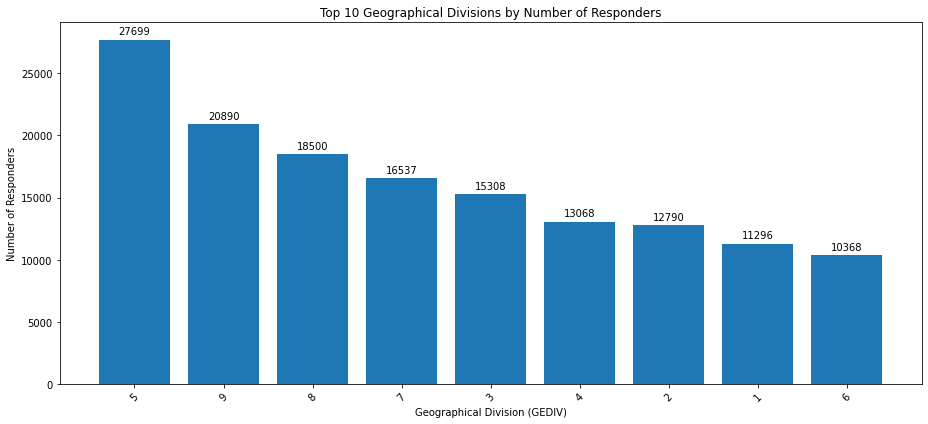

In [0]:
import matplotlib.pyplot as plt

# To visualize this, I would like to Convert the DataFrame to a Pandas DataFrame for easier plotting
responders_count_pd = responders_count_div.limit(10).toPandas()

# Create a bar chart
plt.figure(figsize=(13, 6))
bars = plt.bar(responders_count_pd["GEDIV"], responders_count_pd["responders_count_per_div"])
plt.xlabel("Geographical Division (GEDIV)")
plt.ylabel("Number of Responders")
plt.title("Top 10 Geographical Divisions by Number of Responders")
plt.xticks(rotation=45)
plt.tight_layout()

# Add annotations to each bar at the top
for bar in bars:
    height = bar.get_height()
    plt.annotate(f'{height}', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3), 
                 textcoords="offset points", ha='center', va='bottom')

# Show the plot
plt.show()


#####2b). Now Let's calculate the count of responders per Race (showing top 10)

In [0]:
# Group by Race "PTDTRACE" and count "HEPHONEO"
responders_count_race = df_with_header.groupBy("PTDTRACE").agg(F.count("HEPHONEO").alias("responders_count_per_race"))

# I will Sort the DataFrame by responders_count_per_race in descending order
responders_count_race = responders_count_race.orderBy(F.desc("responders_count_per_race"))

# let's show the top 10 rows
responders_count_race.show(10)

+--------+-------------------------+
|PTDTRACE|responders_count_per_race|
+--------+-------------------------+
|       1|                   100490|
|      -1|                    20391|
|       2|                    13592|
|       4|                     6767|
|       3|                     1806|
|       7|                      899|
|       6|                      885|
|       8|                      576|
|       5|                      464|
|      10|                      122|
+--------+-------------------------+
only showing top 10 rows



##### Let's see if we can visualize this

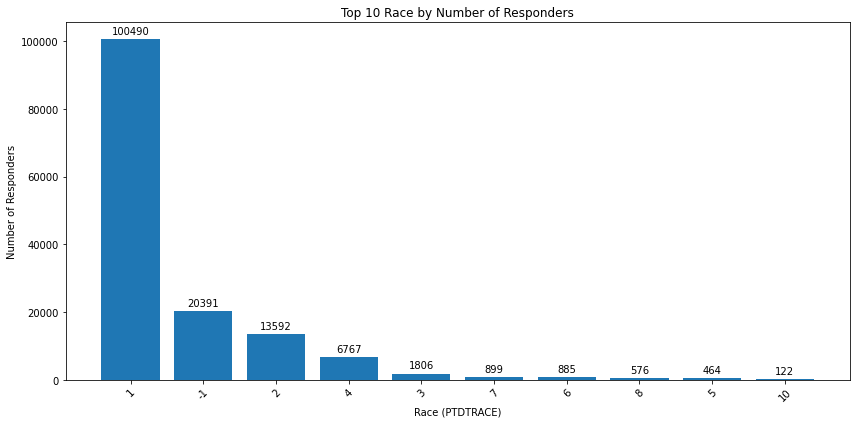

In [0]:
import matplotlib.pyplot as plt

# To visualize this, I would like to Convert the DataFrame to a Pandas DataFrame for easier plotting
responders_count_race1 = responders_count_race.limit(10).toPandas()

# Let's Create a bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(responders_count_race1["PTDTRACE"], responders_count_race1["responders_count_per_race"])
plt.xlabel("Race (PTDTRACE)")
plt.ylabel("Number of Responders")
plt.title("Top 10 Race by Number of Responders")
plt.xticks(rotation=45)
plt.tight_layout()

# Add annotations to each bar
for bar in bars:
    height = bar.get_height()
    plt.annotate(f'{height}', xy=(bar.get_x() + bar.get_width() / 2, height), xytext=(0, 3), 
                 textcoords="offset points", ha='center', va='bottom')

# Show the plot
plt.show()


####3). Now let's count the number of responders who do not have telephone in their house, but can access a telephone elsewhere and telephone interview is accepted?

In [0]:
df_interviewed = df_with_header.filter((df_with_header['HETELAVL'] == 1) & (df_with_header['HEPHONEO'] == 1))

# Count the number of rows in df_pos
row_count = df_interviewed.count()

# Show the count
print("The total number of responders who do not have telephone in their house, but can access a telephone elsewhere and telephone interview is accepted?:", row_count)

The total number of responders who do not have telephone in their house, but can access a telephone elsewhere and telephone interview is accepted?: 3750


####4). Also, let's count How many responders can access a telephone, but telephone interview is not accepted?

In [0]:
df_not_interviewed = df_with_header.filter((df_with_header['HETELAVL'] == 1) & (df_with_header['HETELHHD'] == 1) & (df_with_header['HEPHONEO'] == 2))

# Count the number of rows in df_pos
row_count1 = df_not_interviewed.count()

# Show the count
print("The total number of responders who can access a telephone, but choose not to accept telephone interview:", row_count1)

The total number of responders who can access a telephone, but choose not to accept telephone interview: 0


##### Okay, let's summarise the interview status in DataFrame. Here we are looking at people who have access to telephone, to know if they accepted the telephone interview or declined it.

In [0]:
from pyspark.sql import Row

variable1 = [row_count]
variable2 = [row_count1]

# Let's combine the two lists into a list of tuples
data = list(zip(variable1, variable2))

# Let's create a DataFrame using Row objects
interview_status = spark.createDataFrame([Row(accepted_interview=row[0], declined_interview=row[1]) for row in data])

# Show the DataFrame
display(interview_status)

accepted_interview,declined_interview
3750,0
